In [1]:
%cd ../../../fake-profile-detection

f:\Projects\fake-profile-detection


In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [3]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
stopwords = set(STOPWORDS)

# Preprocessing

In [4]:
from src.eda_pipeline import EDAPipeline
pipe = EDAPipeline(use_tweet=True)
pipe.get_data('MIB')

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
pipe.dfs.keys()

dict_keys(['user_df', 'tweet_metadata_df', 'tweet_df'])

In [11]:
import re
def isAllCaps(word):
    for c in word:
        if c.islower() or not c.isalpha():
            return False
    return True

def hasRepeatedLetters(word):
    prev = ''
    prev2 = ''
    for c in word:
        if c == prev:
            if c == prev2:
                return True
        prev2 = prev
        prev = c
    return False
def text_tags(row):
    URL_PATTERN = r"[(http(s)?):\/\/(www\.)?a-zA-Z0-9@:%._\+~#=]{2,256}\.[a-z]{2,6}\b([-a-zA-Z0-9@:%_\+.~#?&//=]*)"
    rowlist = str(row).split()
    rowlist = [word.strip() for word in rowlist]
    rowlist = [word if not word.strip().startswith(
        '#') else "hashtagtag" for word in rowlist]
    rowlist = [word if not word.strip().startswith(
        '@') else "usertag" for word in rowlist]
    rowlist = [word if not isAllCaps(
        word.strip()) else word.lower() + " allcapstag" for word in rowlist]
    rowlist = [word if not hasRepeatedLetters(
        word.strip()) else word + " repeatedtag" for word in rowlist]
    rowlist = [word.lower() for word in rowlist]
    rowlist = [re.sub(URL_PATTERN, "urltag", word) for word in rowlist]
    return " ".join(rowlist)


In [12]:
df = pipe.dfs['tweet_df']
df["text"] = df["text"].apply(text_tags)

In [13]:
import tensorflow as tf
tokenizer = tf.keras.preprocessing.text.Tokenizer()
tokenizer.fit_on_texts(df["text"])

In [15]:
word_index = tokenizer.__dict__['word_index']
wordcloud = WordCloud(width = 1600, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate_from_frequencies(word_index)

<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

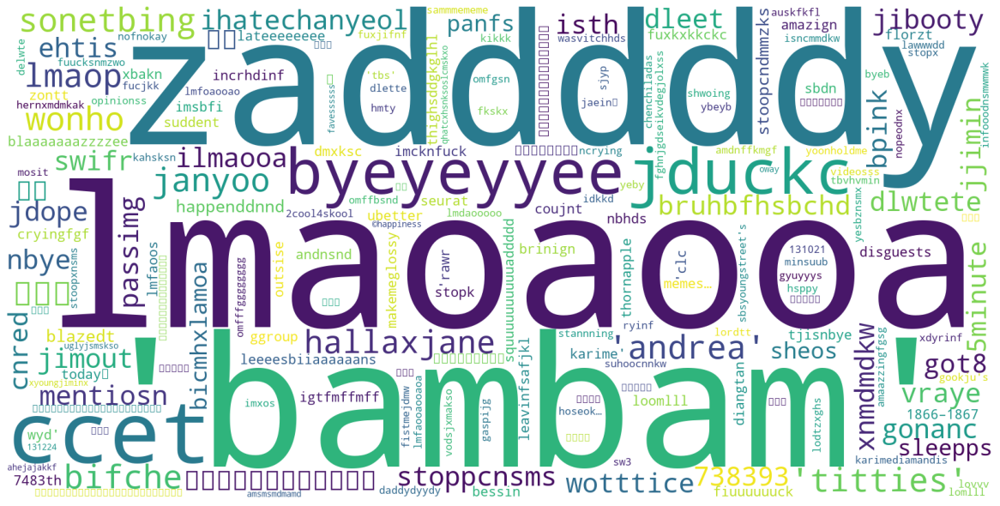

In [16]:
# plot the WordCloud image                      
plt.figure(figsize = (16, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [17]:
word_df = pd.DataFrame.from_dict(word_index, orient='index', columns=['freq'])
word_df.head(10)

,freq
allcapstag,1
usertag,2
the,3
urltag,4
rt,5
a,6
i,7
to,8
hashtagtag,9
you,10


In [18]:
word_df = word_df.sort_values(by='freq', ascending=False)
word_df.head(10)

,freq
lmaoaooa,1635966
zadddddy,1635965
'bambam',1635964
ccet,1635963
byeyeyyee,1635962
jduckc,1635961
sonetbing,1635960
lmaop,1635959
'titties',1635958
꽃지호,1635957


# Cloud by lang

In [21]:
df_user = pipe.dfs['user_df']
df_tweet_lang = df.merge(df_user[['id', 'lang']], left_on='user_id', right_on='id')

In [22]:
df_tweet_lang.shape
df.shape

(11979749, 5)

(11979749, 3)

Language:  it


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

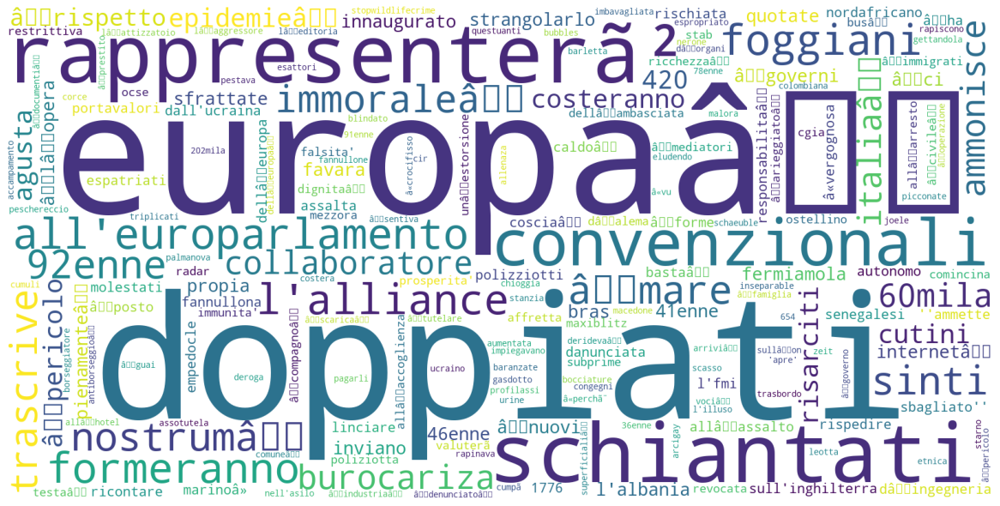

Language:  en


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

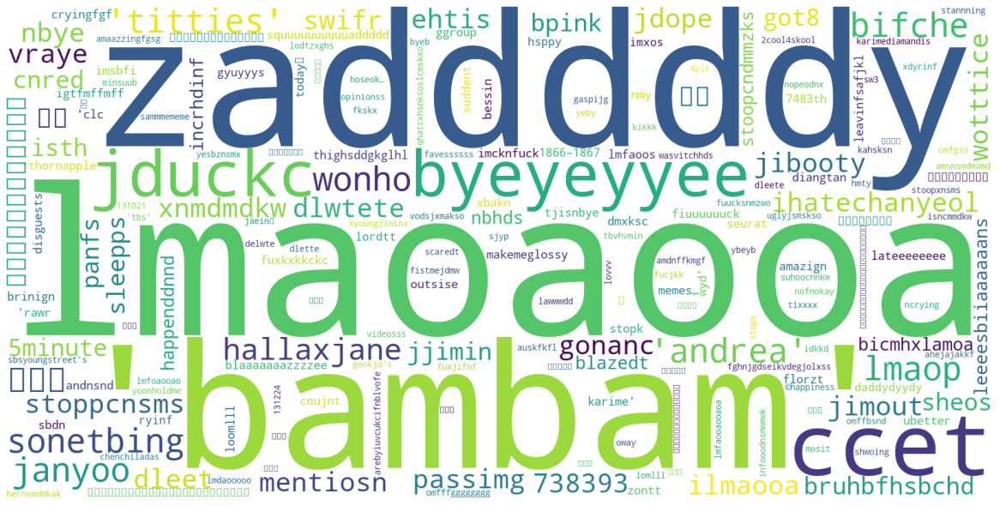

Language:  de


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

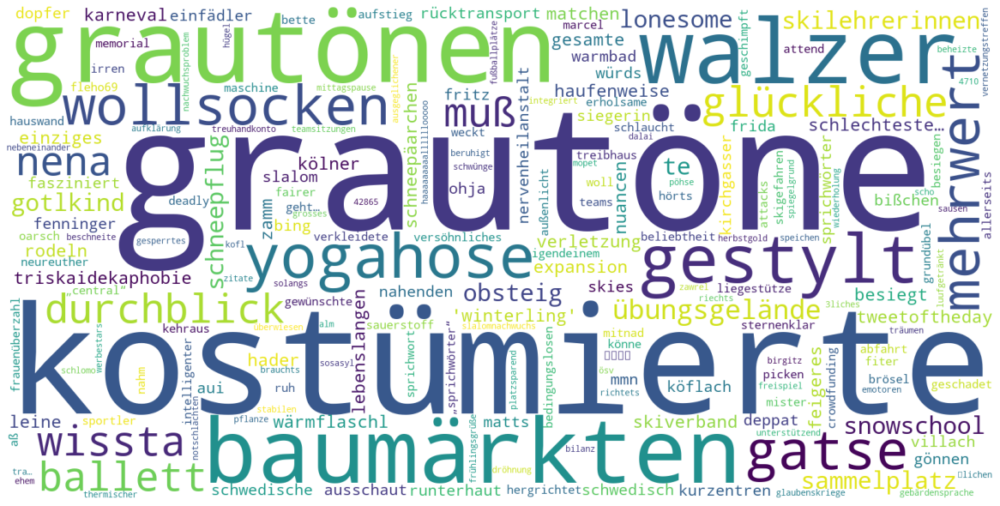

Language:  ja


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

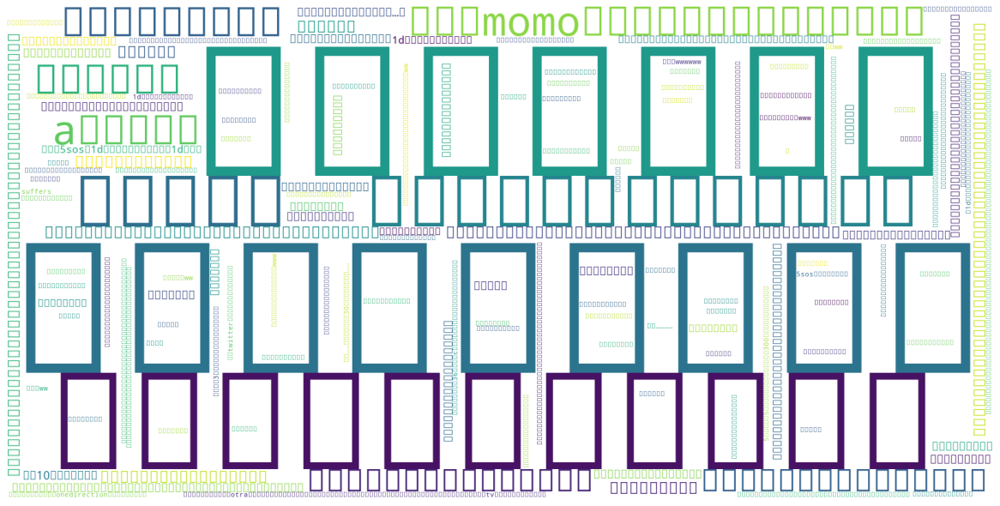

Language:  ru


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

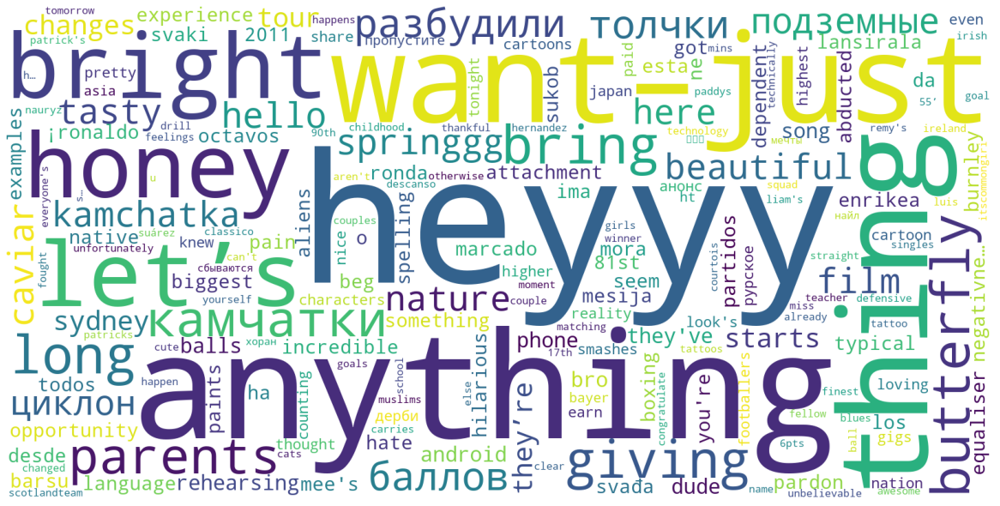

Language:  nl


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

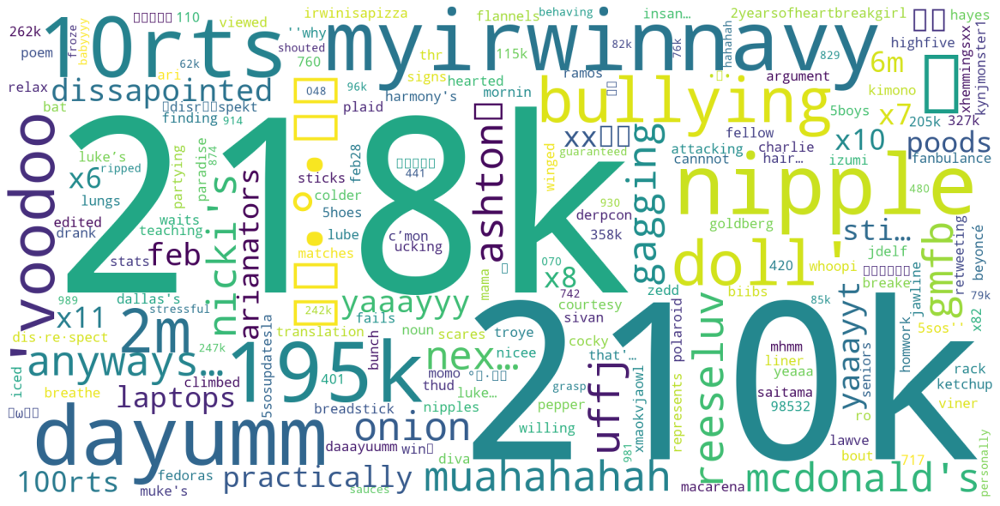

Language:  en-gb


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

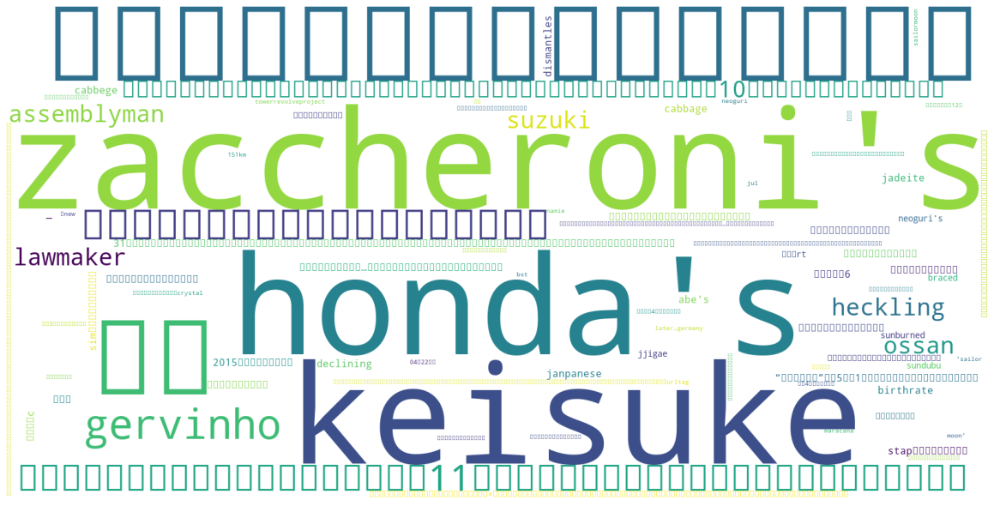

Language:  pt


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

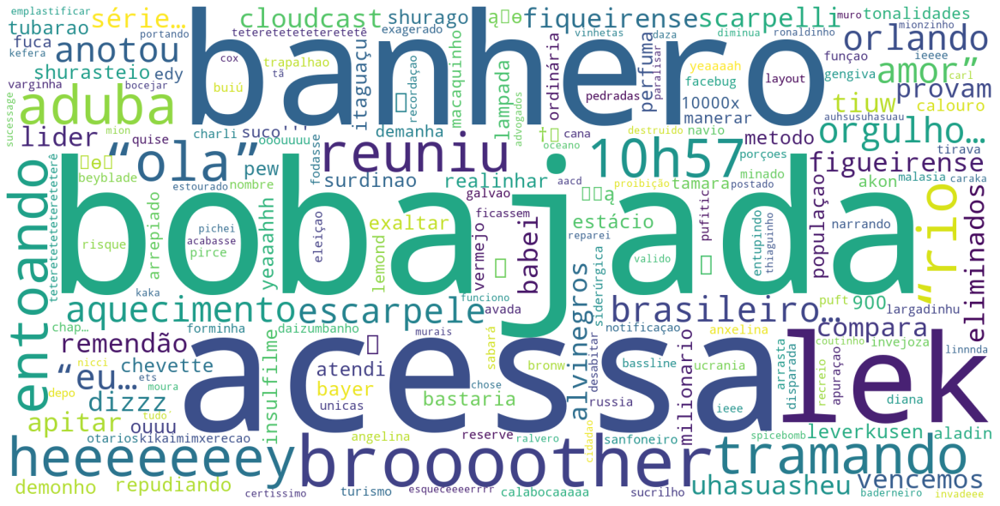

Language:  nan
Language:  es


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

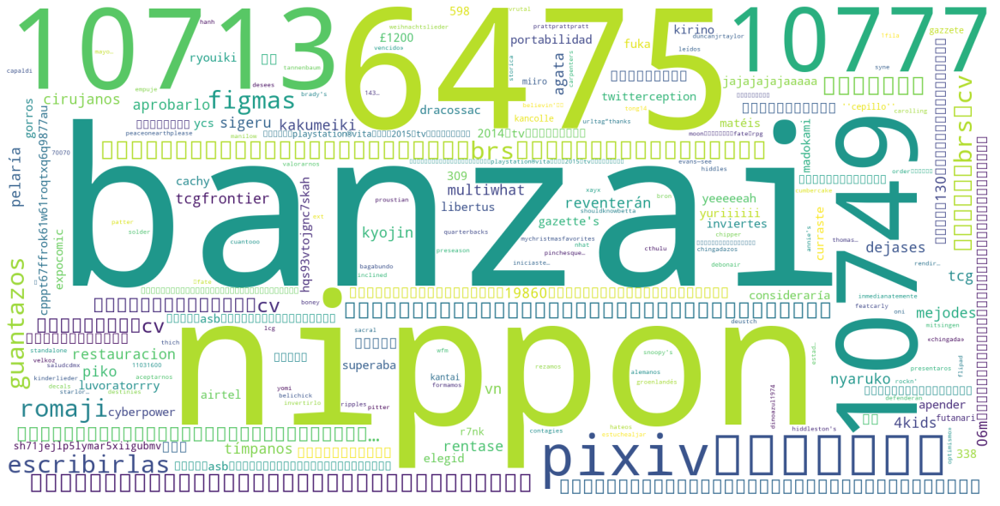

Language:  sv


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

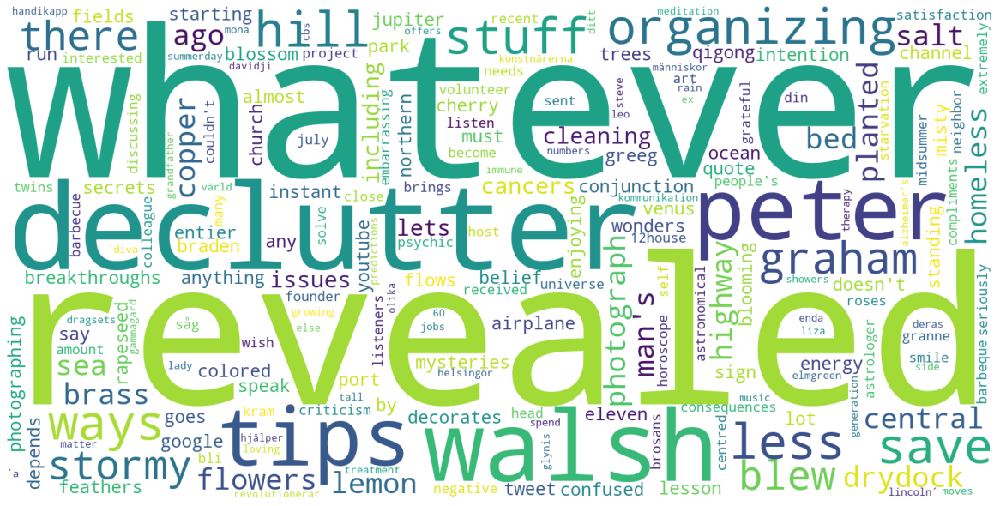

Language:  fr


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

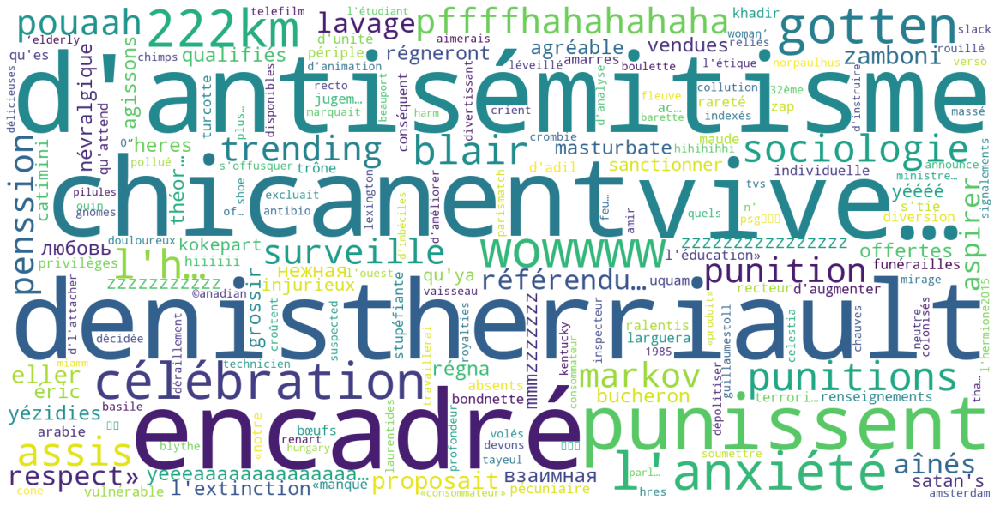

Language:  en-GB


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

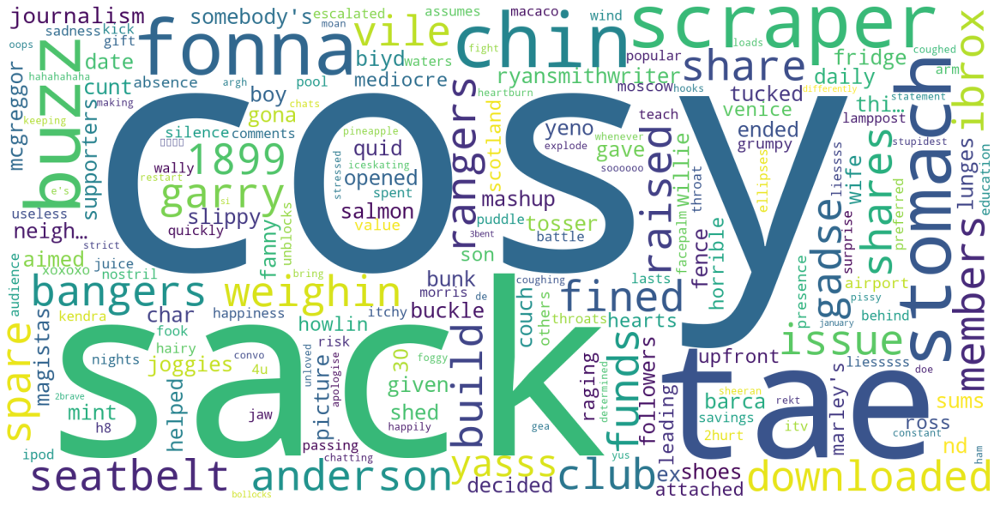

Language:  pl


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

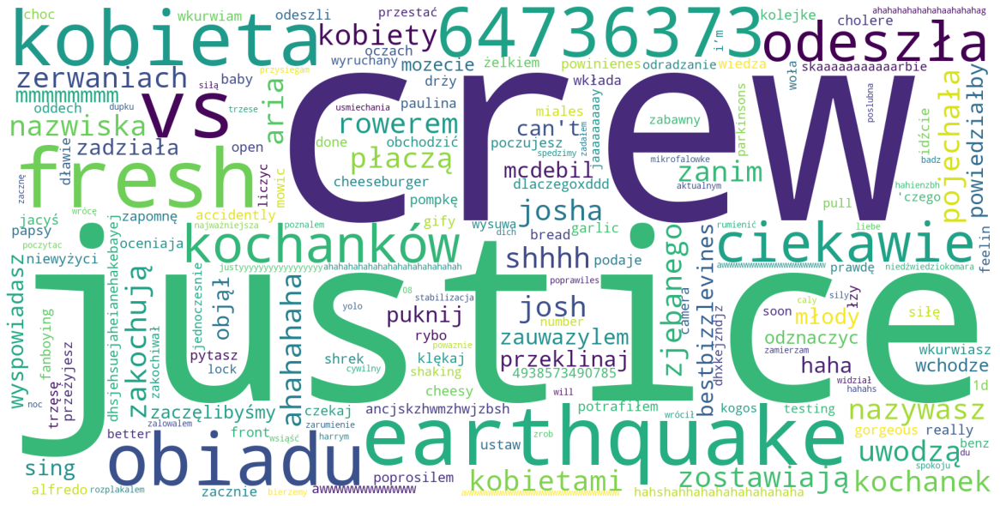

Language:  zh-tw


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

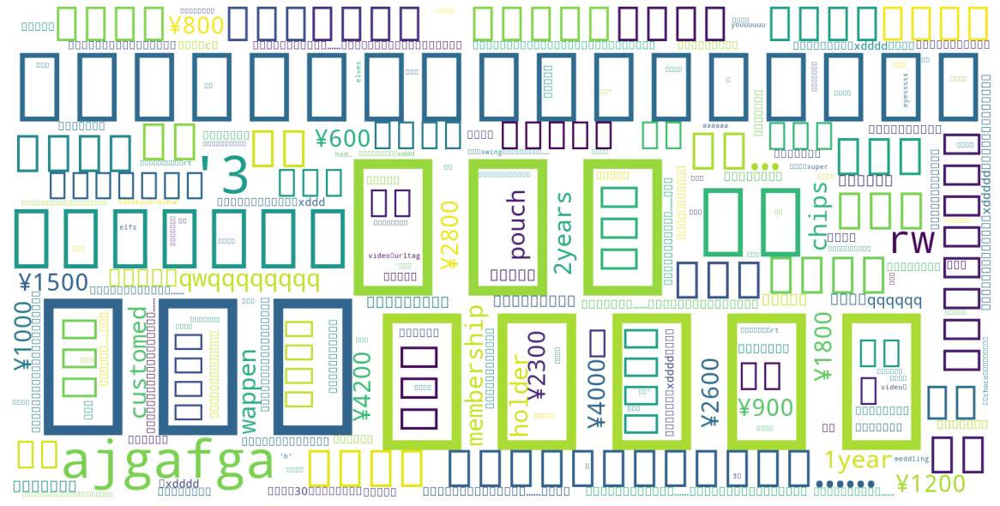

Language:  xx-lc


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

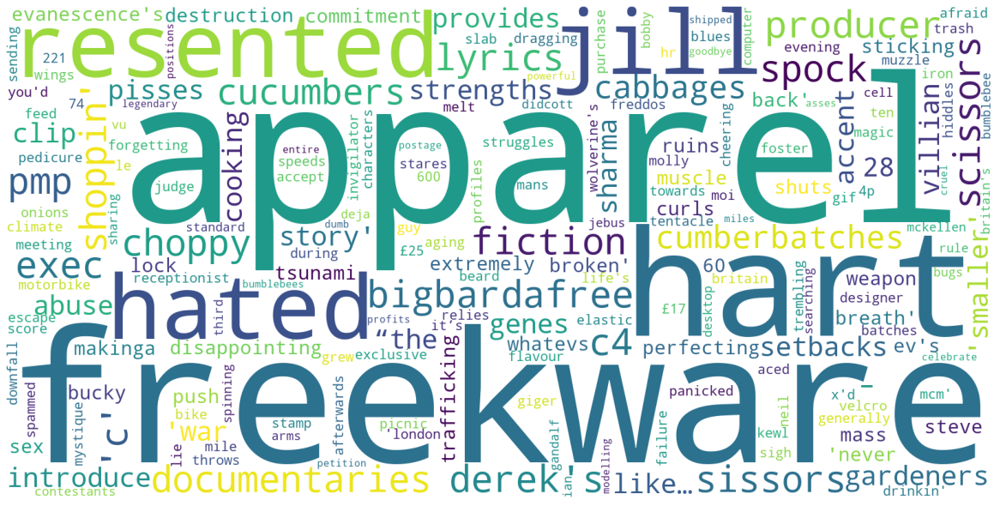

Language:  tr


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

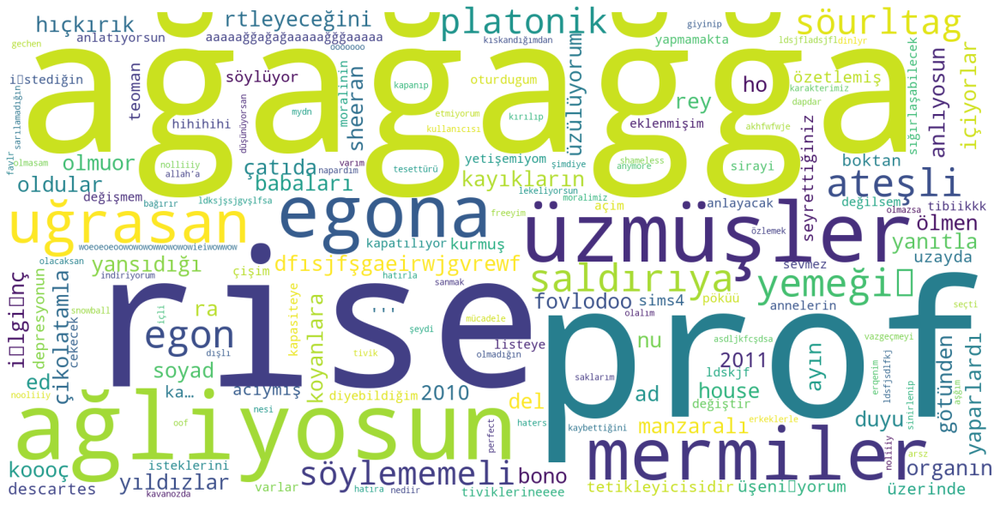

Language:  zh-TW


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

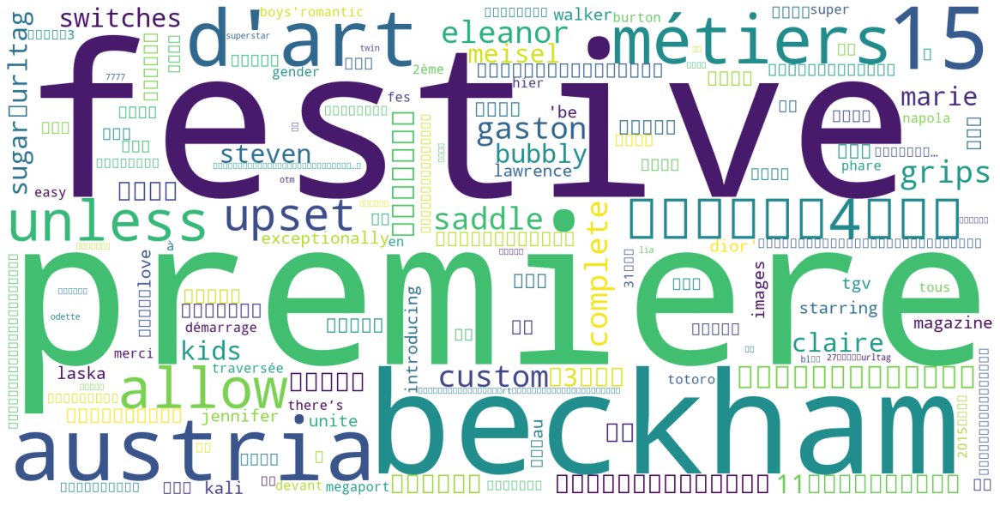

Language:  id


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

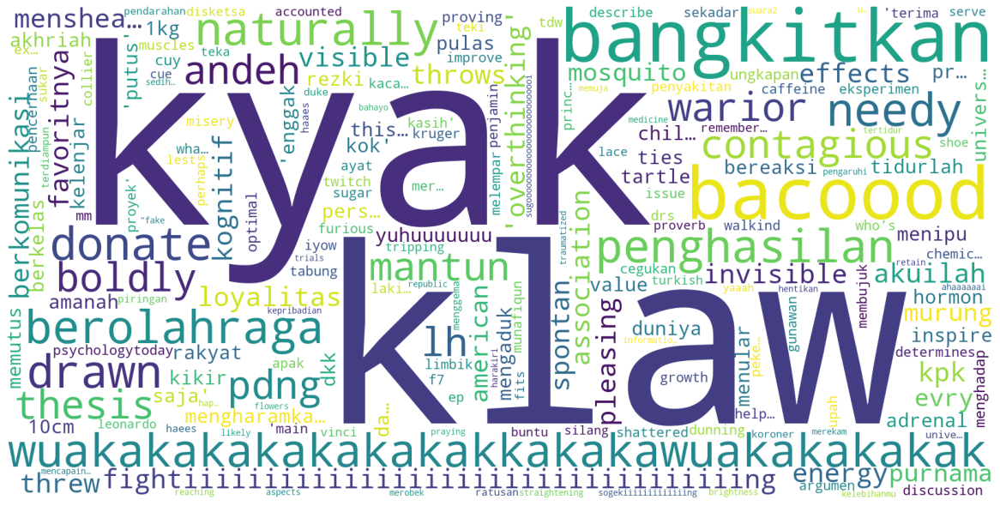

Language:  ko


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

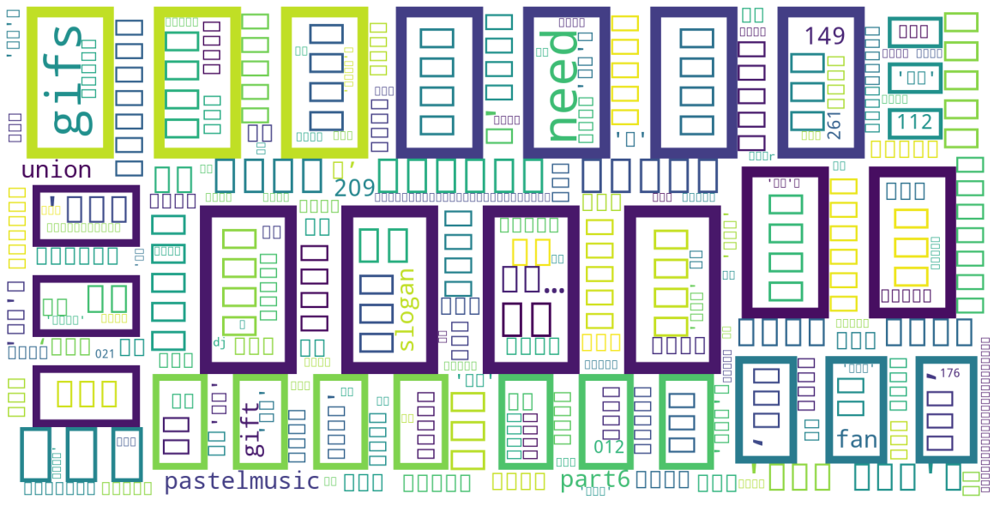

Language:  da


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

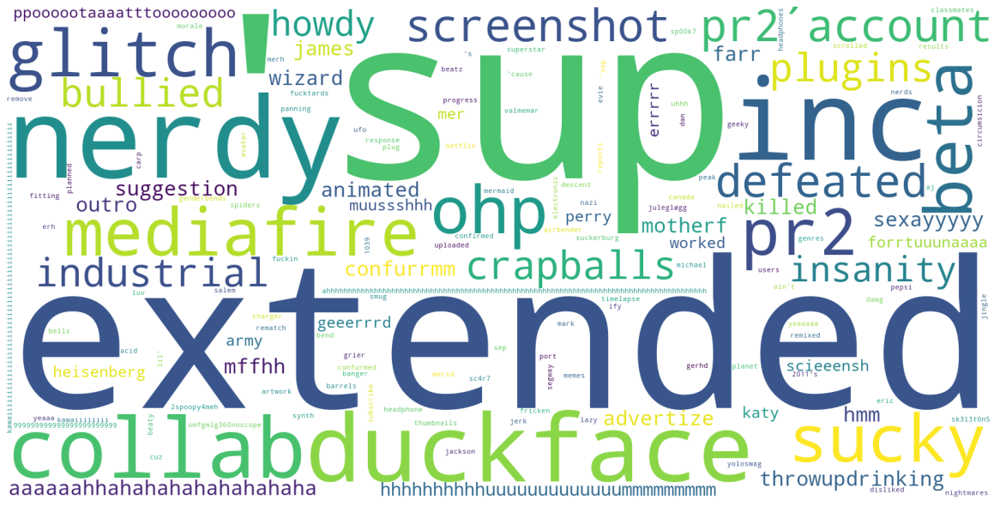

Language:  Select Language...


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

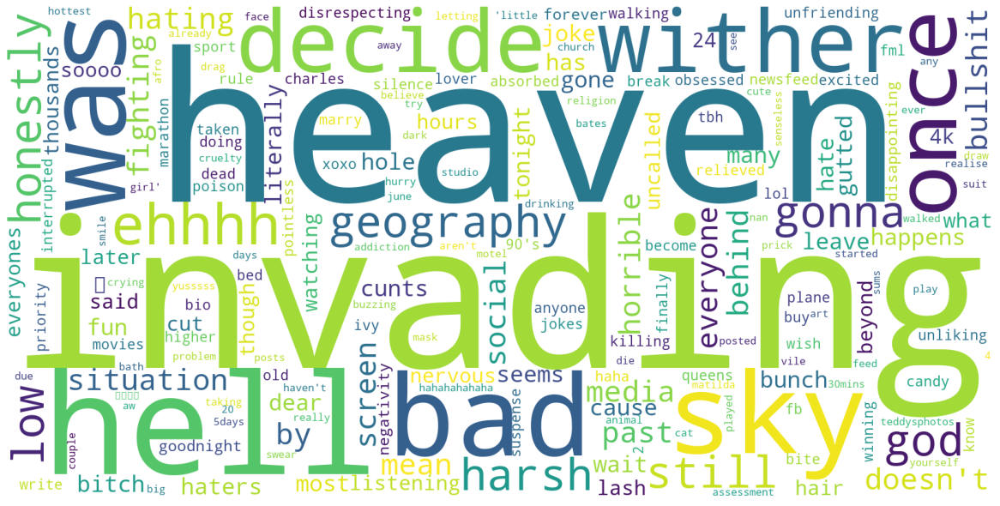

Language:  ar


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

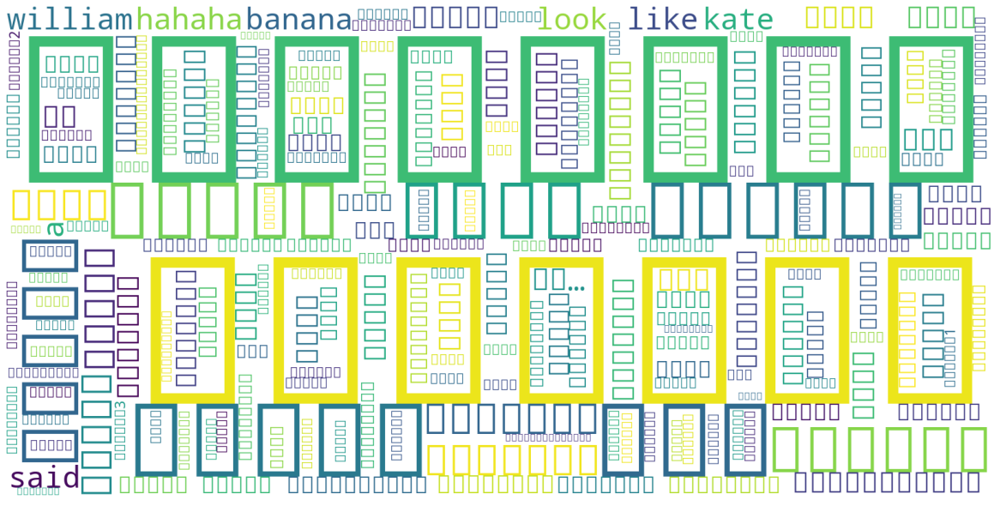

Language:  fil


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

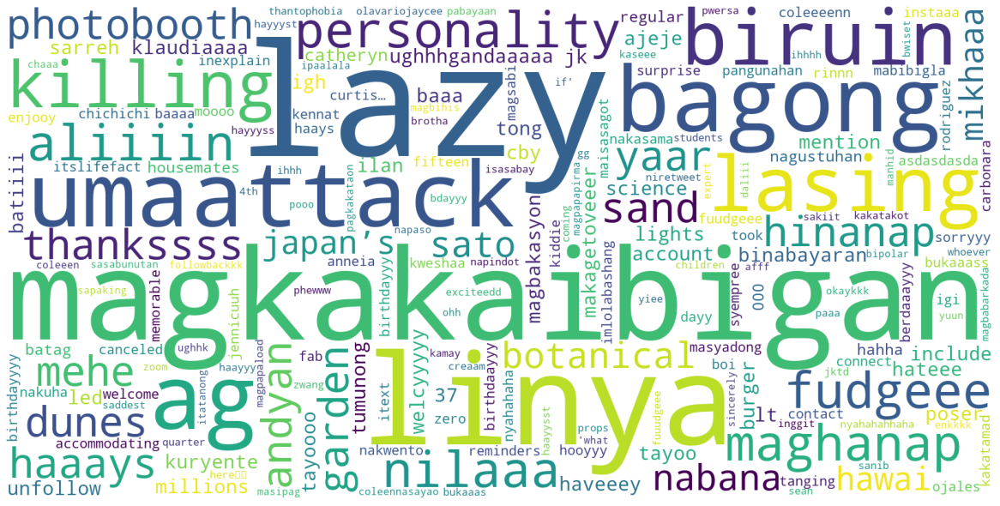

Language:  en-AU


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

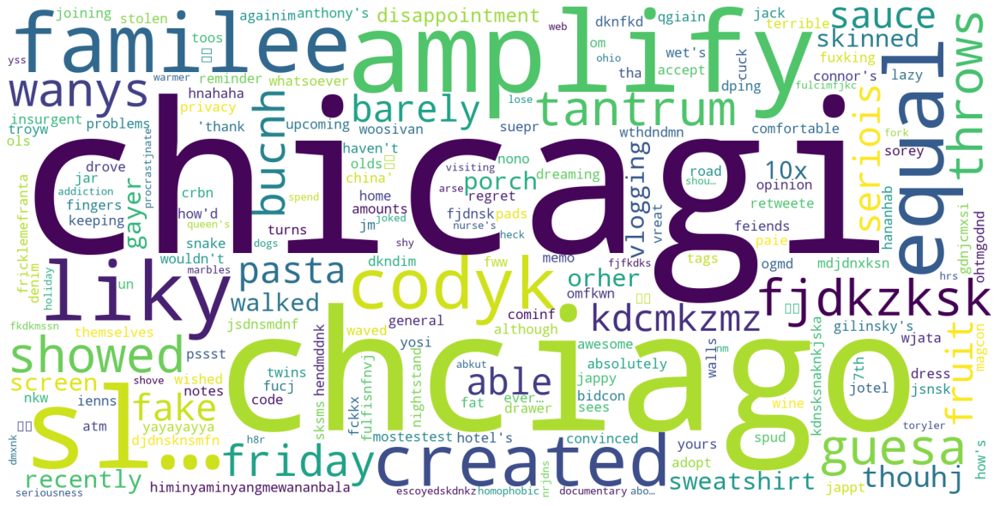

Language:  el


<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

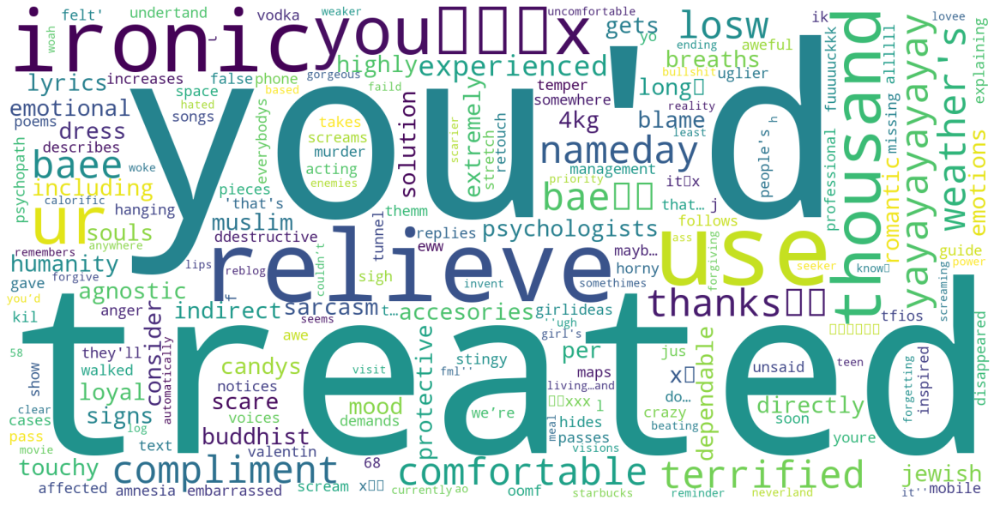

In [41]:
lang_series = df_tweet_lang['lang']
for lang in df_tweet_lang['lang'].unique():
    print('Language: ', lang)
    tokenizer = tf.keras.preprocessing.text.Tokenizer()
    df_plot = df_tweet_lang[lang_series== lang]["text"]
    if df_plot.shape[0] == 0: continue
    tokenizer.fit_on_texts(df_plot)

    word_index = tokenizer.__dict__['word_index']
    wordcloud = WordCloud(width = 1600, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate_from_frequencies(word_index)

    # plot the WordCloud image                      
    plt.figure(figsize = (16, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    
    plt.show()

In [54]:
meta = pipe.dfs['tweet_metadata_df']
meta.head(1)
meta.shape
meta.columns

,id,id_,source,user_id,truncated,in_reply_to_status_id,in_reply_to_user_id,in_reply_to_screen_name,retweeted_status_id,geo,...,retweeted,possibly_sensitive,num_hashtags,num_urls,num_mentions,created_at,timestamp,crawled_at,updated,label
0,24858289,532627591686275072,"<a href=""http://www.facebook.com/twitter"" rel=...",24858289,NaN,0,0,NaN,0,NaN,...,NaN,NaN,0,1,0,Wed Nov 12 20:14:48 +0000 2014,2014-11-12 21:14:48,2014-11-12 21:44:09,2014-11-12 21:44:09,1


(11979749, 26)

Index(['id', 'id_', 'source', 'user_id', 'truncated', 'in_reply_to_status_id',
       'in_reply_to_user_id', 'in_reply_to_screen_name', 'retweeted_status_id',
       'geo', 'place', 'contributors', 'retweet_count', 'reply_count',
       'favorite_count', 'favorited', 'retweeted', 'possibly_sensitive',
       'num_hashtags', 'num_urls', 'num_mentions', 'created_at', 'timestamp',
       'crawled_at', 'updated', 'label'],
      dtype='object')

In [72]:
meta_grouped = meta.groupby('user_id').sum().reset_index()[[
    'user_id', 'retweet_count', 'reply_count', 'favorite_count', 
    'num_hashtags', 'num_urls', 'num_mentions'
]].merge(df_user[['id', 'label']], left_on='user_id', right_on='id')
meta_grouped.head()
meta_grouped['label'].unique()

,user_id,retweet_count,reply_count,favorite_count,num_hashtags,num_urls,num_mentions,id,label
0,678033,242725,0,1676,1177,951,3556,678033,0
1,722623,908396,0,1303,1154,523,2279,722623,0
2,755116,105864,0,522,129,397,3078,755116,0
3,755746,644062,0,276,873,1493,2206,755746,0
4,785080,139956,0,1662,168,207,2531,785080,0


array([0, 1], dtype=int64)

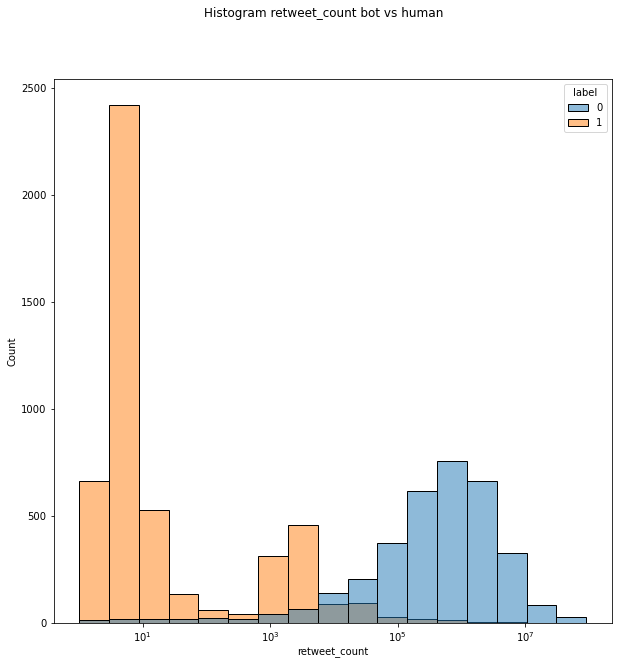

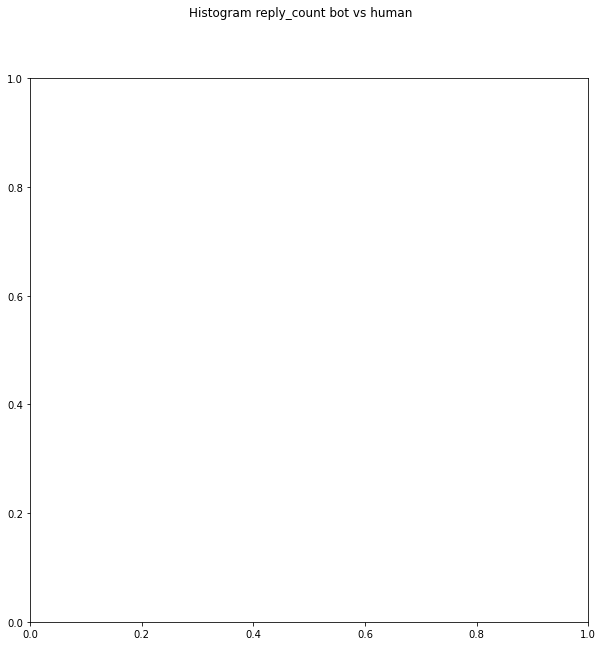

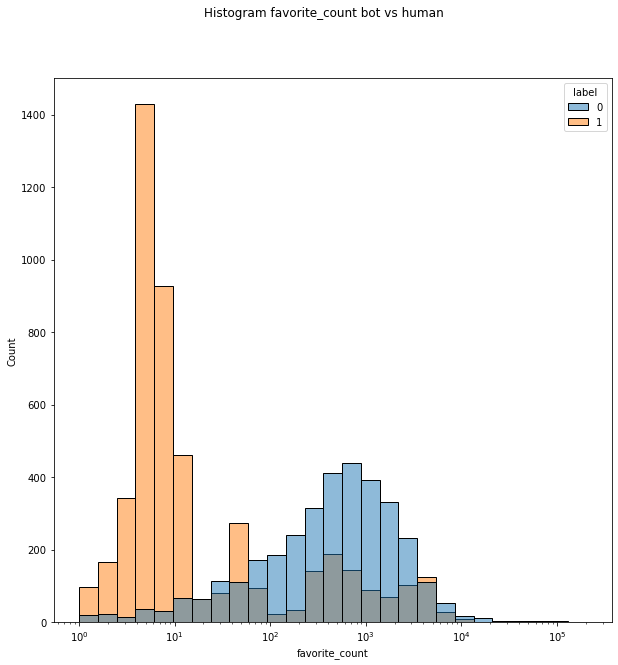

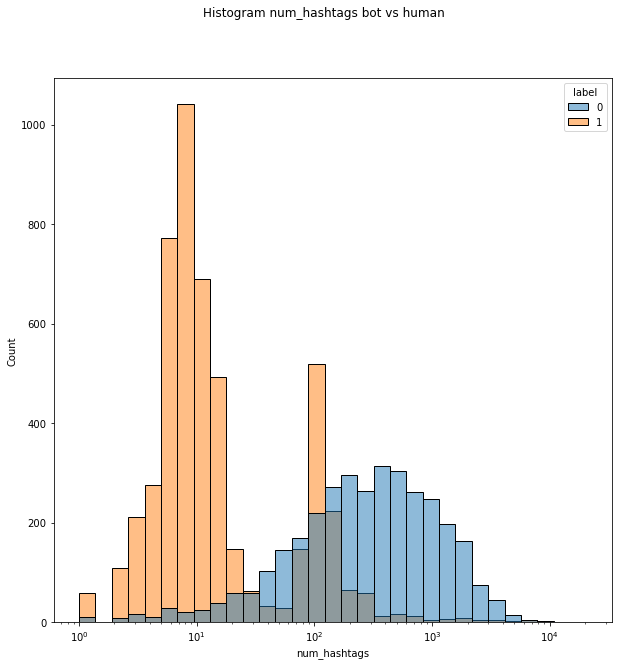

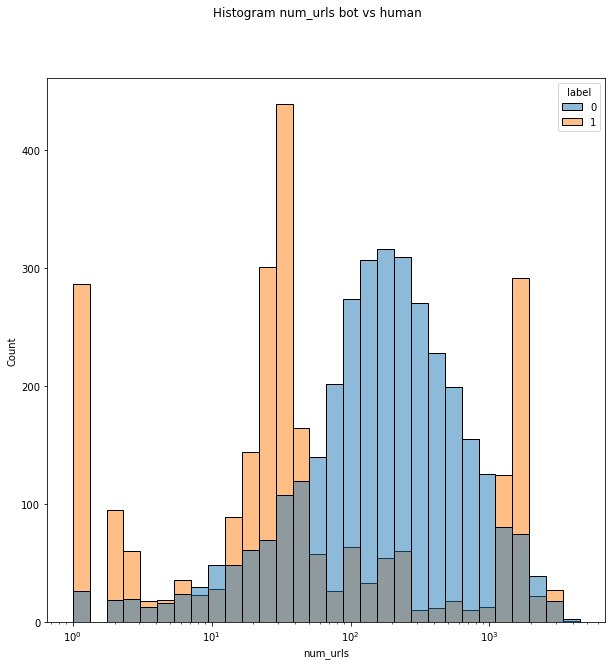

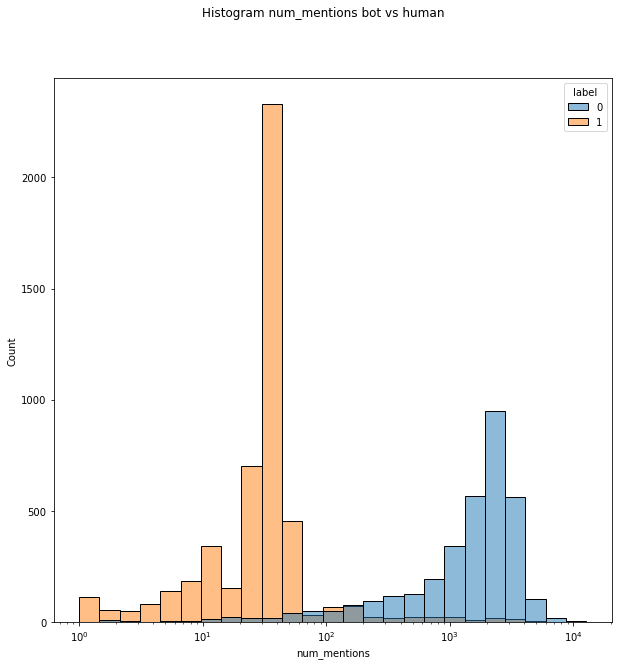

In [73]:
def plot_log_hist(feature):
    figure = plt.figure(figsize=(10,10))

    test = meta_grouped[meta_grouped[feature] > 0.0]
    sns.histplot(data=test, x=feature, hue='label', log_scale=True)

    figure.patch.set_facecolor('white')
    plt.suptitle(f'Histogram {feature} bot vs human')
    plt.show()
feature_list = [
    'retweet_count', 'reply_count', 'favorite_count', 
    'num_hashtags', 'num_urls', 'num_mentions'
]
for i, feature in enumerate(feature_list):
    plot_log_hist(feature)